In [1]:
import scanpy as sc
import anndata as ad
import squidpy as sq

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from tqdm import tqdm

from scipy.cluster.hierarchy import dendrogram, linkage, distance, fcluster

In [3]:
adata = sc.read_h5ad("../data/interim/visium_annotated_over.h5ad")

In [17]:
clone_col = [ '0', '1', '2', '3', '4', '5',
       '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', 'diploid']
ct_col = ['B.cells', 'T.cells', 'Endothelial', 'CAFs', 'Plasmablasts', 'Myeloid','Cancer Epithelial', 'Normal Epithelial', 'PVL']
clone_mat = adata.obs[clone_col]

In [6]:
vis_nodes = adata.obs.index

In [10]:
# convert array_row and array_col columns to integers in visium.obs dataframe
adata.obs["array_row"] = adata.obs["array_row"].astype(int)
adata.obs["array_col"] = adata.obs["array_col"].astype(int)

In [15]:
edges_vis = dict()
for node in vis_nodes:
    edges_vis[node] = []
    x= adata.obs.loc[node].array_row
    y= adata.obs.loc[node].array_col
    nodes = adata.obs[(adata.obs.array_row >=x-1)&(adata.obs.array_row <=x+1)&(adata.obs.array_col <=y+1)&(adata.obs.array_col >=y-1)].index
    for n in nodes:
        if n != node:
            edges_vis[node].append(n)


In [24]:
feature_set = []
for node in tqdm(edges_vis):
    neigb = edges_vis[node] + [node]
    feature_set.append(clone_mat.loc[neigb].mean().values)
    


type: name 'tqdm' is not defined

In [22]:
edges_vis[node] 

['ATGAGTAGCGTGTTAG-1', 'GTCGAACCGTTCACTC-1']

0          8.746649e-07
1          2.900323e-04
2          7.724032e-03
3          1.329739e-04
4          5.478273e-04
5          4.506027e-01
6          3.819710e-04
7          1.033283e-03
8          8.352315e-02
9          5.862872e-04
10         2.352806e-03
11         1.614946e-03
12         2.058469e-04
13         1.162449e-05
14         5.802857e-05
15         2.389106e-04
16         1.074544e-08
diploid    4.506947e-01
dtype: float32

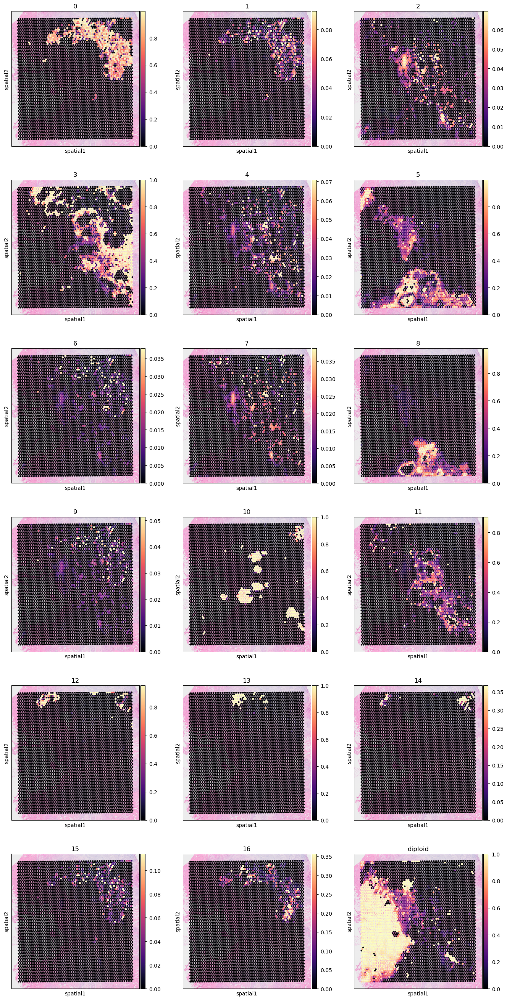

In [23]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(adata, cmap='magma',
                  # show first 8 cell types
                  color=clone_col,
                  ncols=3, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                 )

/home/o313a/miniconda3/envs/sq_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 1000/1000 [00:01<00:00, 595.71/s]


/home/o313a/miniconda3/envs/sq_env/lib/python3.10/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in true_divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


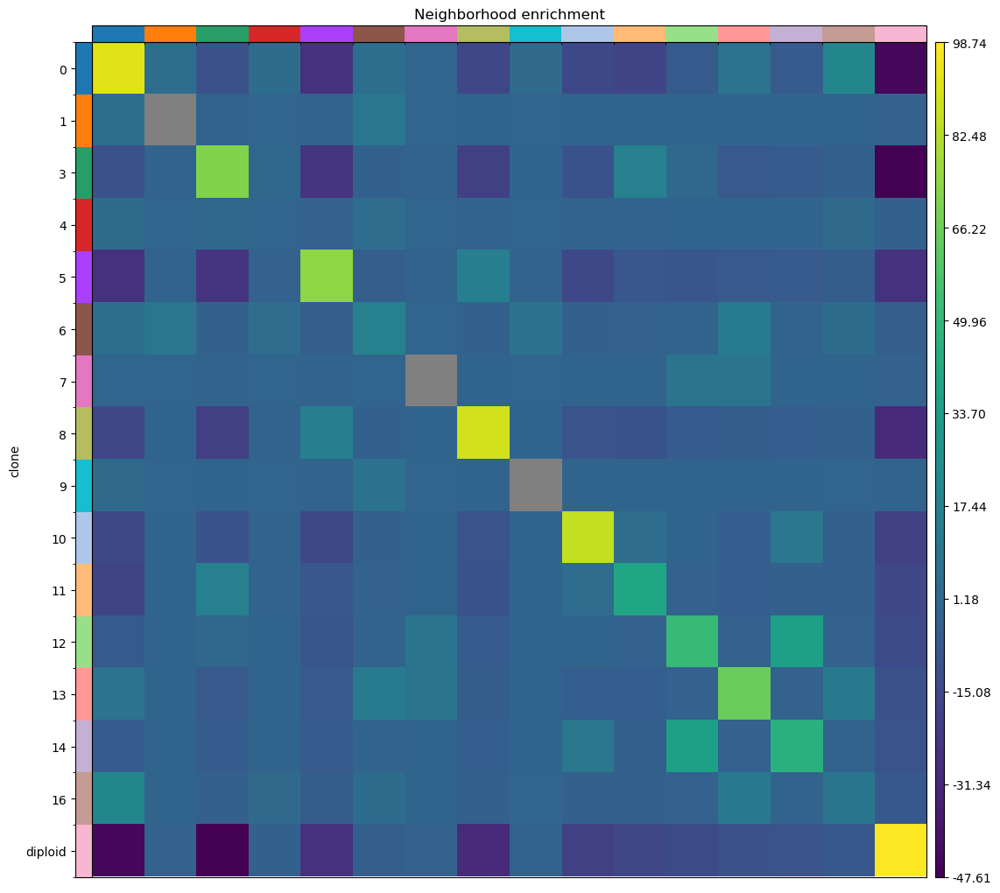

In [48]:
sq.gr.spatial_neighbors(adata)
sq.gr.nhood_enrichment(adata, cluster_key="clone")
sq.pl.nhood_enrichment(adata, cluster_key="clone")

In [52]:
enr = adata.uns["clone_nhood_enrichment"]["zscore"]

In [57]:
clone_col_present = ['0',
 '1',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '16',
 'diploid']

In [59]:
len(clone_col_present)

16

In [60]:
enr = pd.DataFrame(enr, index =clone_col_present, columns = clone_col_present )

In [62]:
np.fill_diagonal(enr.values, 91.735971)

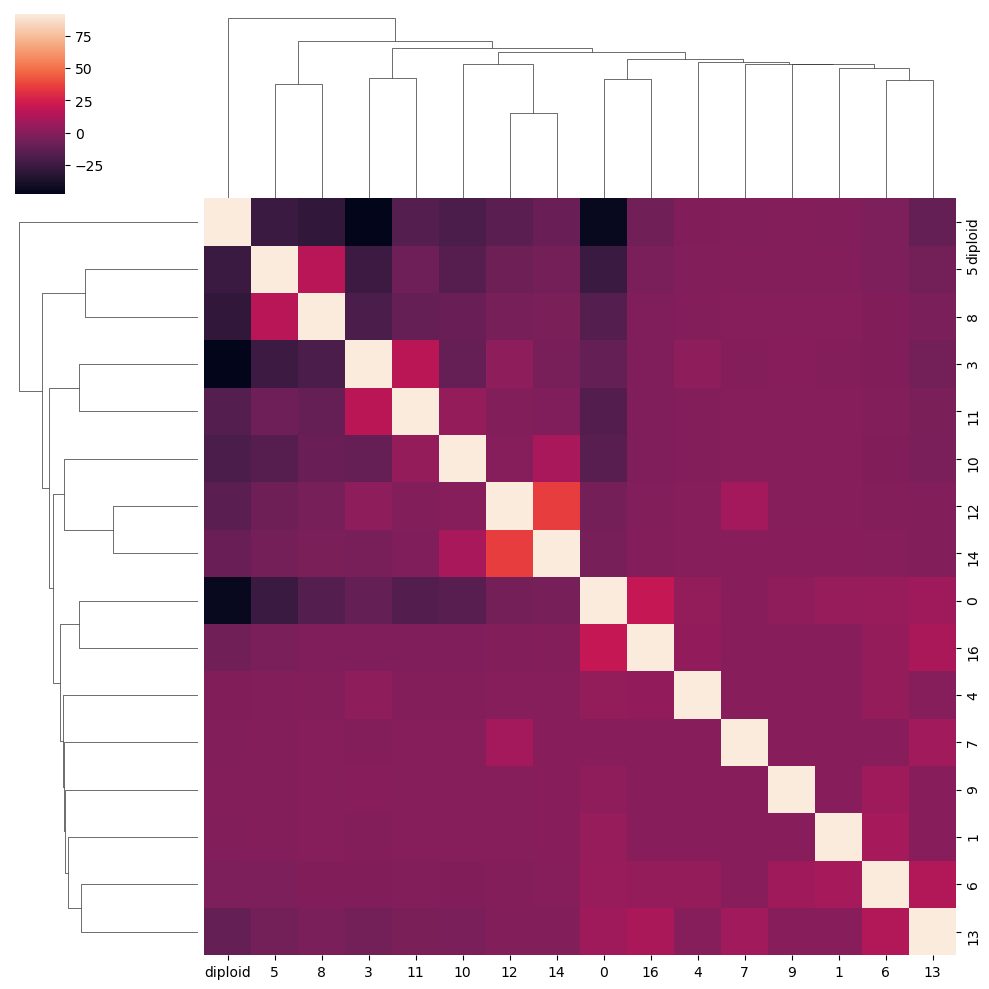

In [64]:
sns.clustermap(enr)

In [65]:
enr

,0,1,3,4,5,6,7,8,9,10,11,12,13,14,16,diploid
0,91.735971,5.043919,-11.297819,3.978825,-26.174413,5.469875,0.234082,-16.632521,2.793331,-15.646709,-17.344526,-5.925487,7.864309,-5.410305,19.614610,-44.659751
1,5.043919,91.735971,-1.180260,-0.054855,-0.952602,9.949874,-0.031639,-0.620918,-0.044766,-0.562978,-0.657094,-0.305126,-0.241249,-0.220326,-0.172818,-1.686211
3,-11.297819,-1.180260,91.735971,2.094647,-24.946607,-1.887211,-1.213511,-20.002797,-0.185748,-10.639562,16.190466,2.087619,-6.722643,-4.984788,-2.735084,-47.605477
4,3.978825,-0.054855,2.094647,91.735971,-1.646901,4.453463,-0.031639,-1.061875,-0.031639,-0.951460,-1.063580,-0.540074,-0.432835,-0.383696,3.219609,-2.339496
5,-26.174413,-0.952602,-24.946607,-1.646901,91.735971,-3.265212,-0.939541,15.585438,-0.950671,-16.148995,-8.132340,-8.530021,-6.669183,-5.829219,-4.508663,-26.198837
6,5.469875,9.949874,-1.887211,4.453463,-3.265212,91.735971,-0.119159,-2.266298,7.386173,-2.084542,-1.831121,-1.136853,13.489106,-0.731006,4.291571,-3.301671
7,0.234082,-0.031639,-1.213511,-0.031639,-0.939541,-0.119159,91.735971,-0.645046,-0.044766,-0.537794,-0.587484,8.729745,8.455051,-0.212779,-0.160128,-1.731517
8,-16.632521,-0.620918,-20.002797,-1.061875,15.585438,-2.266298,-0.645046,91.735971,-0.622358,-9.930538,-11.014526,-5.493446,-4.360526,-3.673972,-2.855872,-29.569416
9,2.793331,-0.044766,-0.185748,-0.031639,-0.950671,7.386173,-0.044766,-0.622358,91.735971,-0.574045,-0.645991,-0.343078,-0.243561,-0.196014,-0.147029,-0.819222
10,-15.646709,-0.562978,-10.639562,-0.951460,-16.148995,-2.084542,-0.537794,-9.930538,-0.574045,91.735971,4.611628,-0.429932,-4.104351,10.555176,-2.796831,-19.927533


In [68]:
pdist = distance.pdist(enr)
link = linkage(pdist, method='complete')


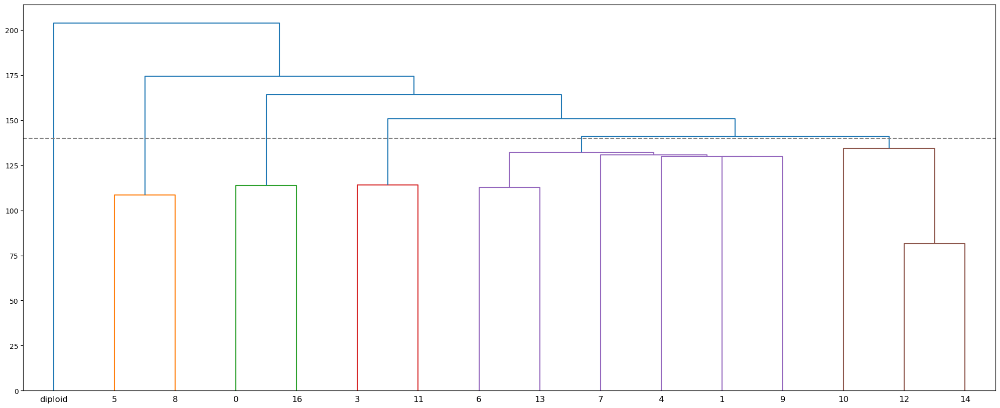

In [116]:
t = 140
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(link,color_threshold = t, labels = enr.columns)
plt.axhline(t, ls = "--", color = "grey" )

In [105]:
clusters = fcluster(link, t, criterion='distance')

In [106]:
clusters

array([2, 4, 3, 4, 1, 4, 4, 1, 4, 5, 3, 5, 4, 5, 2, 6], dtype=int32)

Index(['0', '1', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13',
       '14', '16', 'diploid'],
      dtype='object')

In [108]:
new_clones = []
new_cols = []
un_clusters = np.unique(clusters)
for cl in un_clusters:
    idx = np.where(clusters == cl)[0]
    old_clones =  enr.columns[idx]
    act = clone_mat[old_clones].sum(axis = 1)
    new_clones.append(act.values)
    new_cols.append(" & ".join([str(x) for x in old_clones]))




    

In [109]:
new_clones = pd.DataFrame(new_clones, index = new_cols, columns = clone_mat.index).T

In [110]:
visium = adata.copy()

In [111]:
visium.obs = visium.obs.drop(columns = clone_col + ["clone"])

In [112]:
visium.obs = visium.obs.join(new_clones)

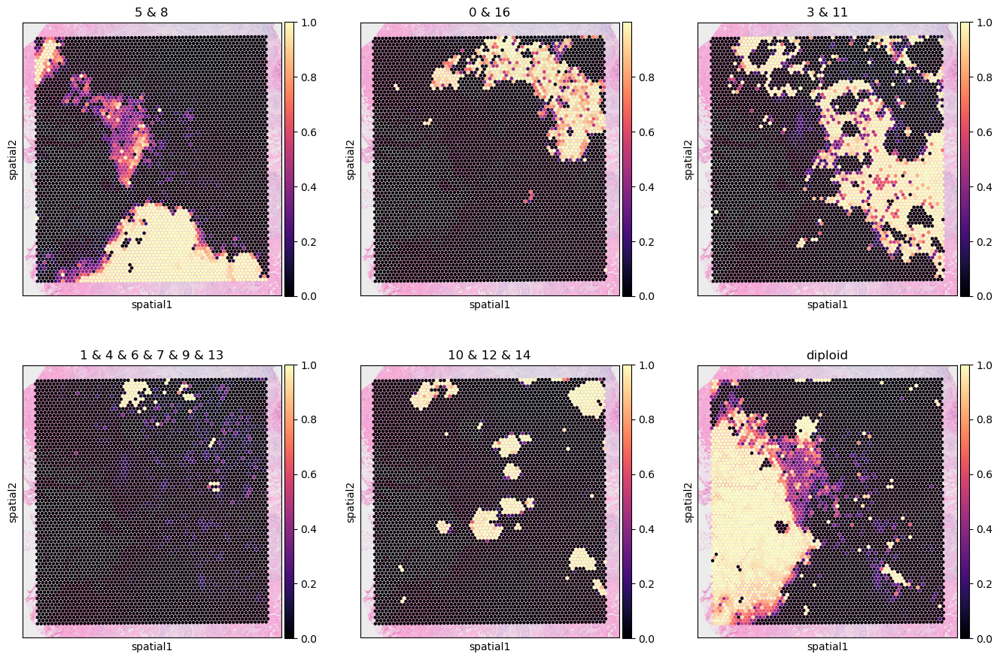

In [113]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color=new_cols,
                  ncols=3, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                 )

In [18]:





def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


In [6]:
model = AgglomerativeClustering(metric = "correlation", distance_threshold=0, n_clusters=None, linkage = "complete").fit(clone_mat)


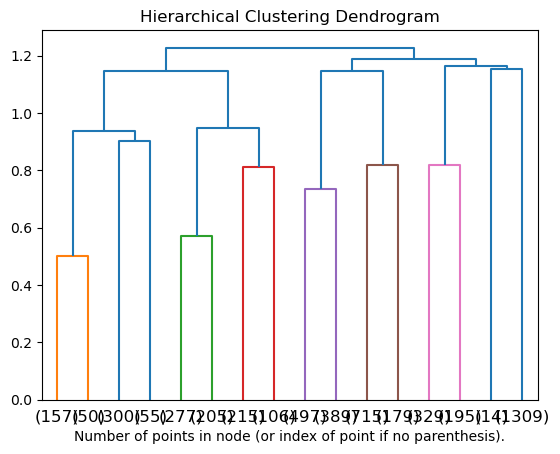

In [7]:
model = model.fit(clone_mat)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [8]:
clustering = AgglomerativeClustering(metric = "correlation", n_clusters = 10, linkage = "complete").fit(clone_mat)


In [9]:
adata.obs["niches_clone"] =[str (x) for x in clustering.labels_]

In [10]:
import matplotlib as mpl


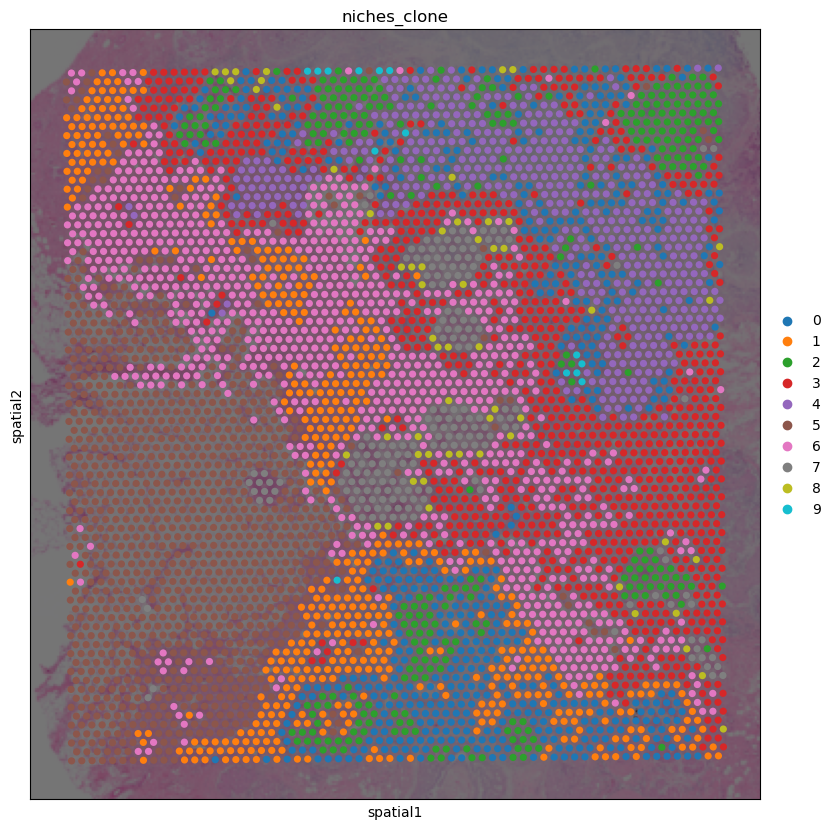

In [11]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    sc.pl.spatial(adata,
                  # show first 8 cell types
                  color="niches_clone",
                img_key='lowres', alpha_img = 0.5,
                 )

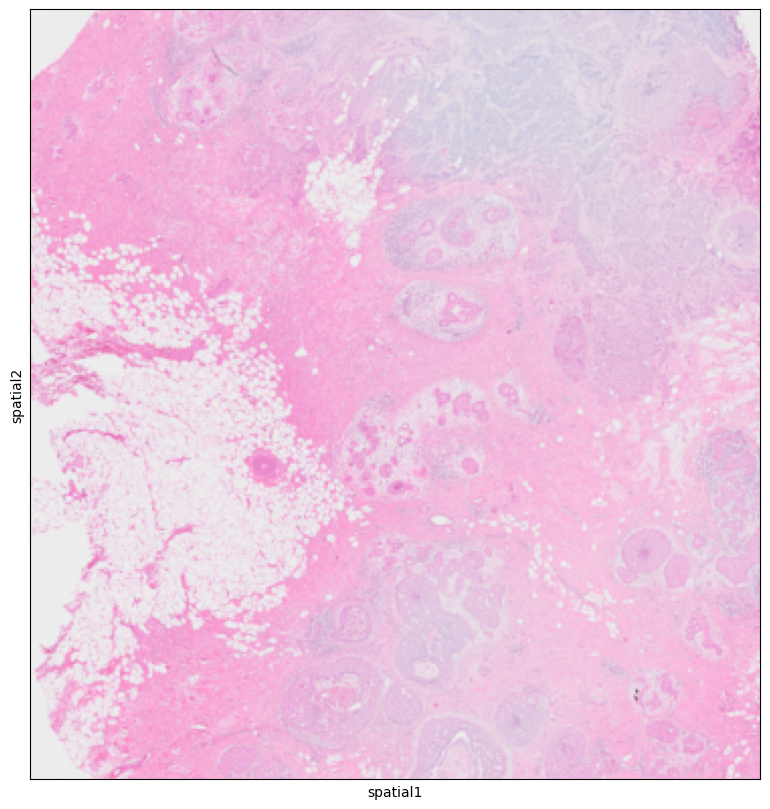

In [12]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    sc.pl.spatial(adata,

                img_key='lowres', 
                 )

In [13]:
clone_mat = adata.obs[clone_col]

In [35]:
from sklearn.metrics.pairwise import cosine_similarity

In [39]:
d = cosine_similarity(clone_mat.T)

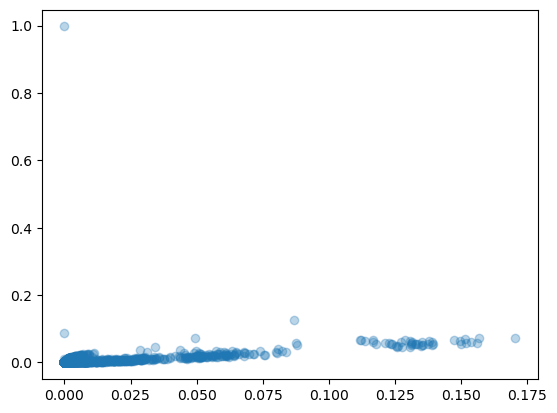

In [46]:
plt.scatter(clone_mat['15'],clone_mat['9'], alpha =0.3)
# plt.xlim(0,0.2)
# plt.ylim(0,0.2)

In [34]:
np.correlate(clone_mat['6'],clone_mat['9'])

array([0.22534862], dtype=float32)

In [14]:
# d = clone_mat.corr()

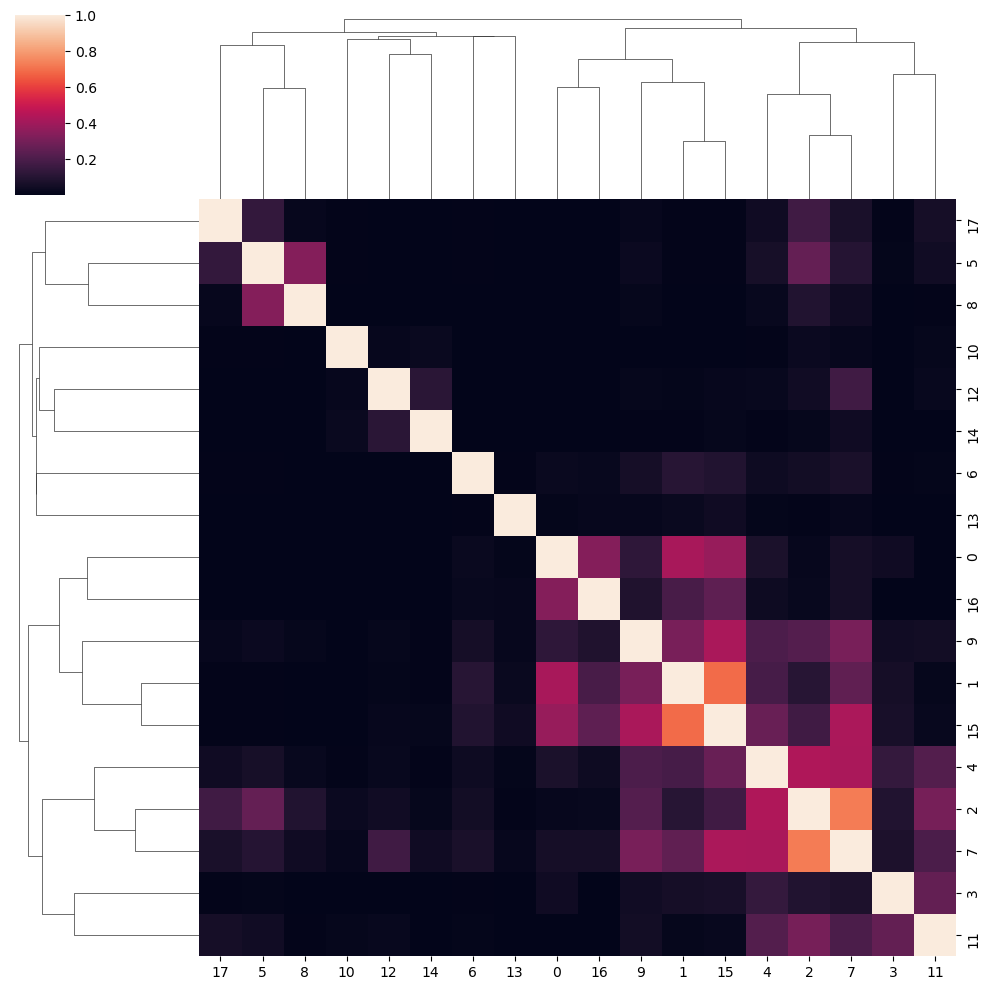

In [40]:
sns.clustermap(d)

In [11]:
pd.DataFrame(n_enr)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,94.804859,5.129273,-11.453143,3.822924,-24.654021,5.522203,0.235606,-16.536052,2.592364,-15.782353,-16.597486,-5.737783,7.540300,-5.374874,19.457525,-44.212964
1,5.129273,NaN,-1.110674,-0.063372,-0.982749,8.103497,-0.031639,-0.614223,-0.044766,-0.556489,-0.637993,-0.344891,-0.255015,-0.224733,-0.163383,-1.650957
2,-11.453143,-1.110674,73.221620,2.170564,-24.159605,-1.949296,-1.209723,-20.263650,-0.116318,-11.012709,15.860346,2.221075,-6.763881,-5.094359,-2.621902,-47.868704
3,3.822924,-0.063372,2.170564,-0.044766,-1.586606,4.836602,-0.054855,-1.052651,-0.044766,-0.999561,-1.059788,-0.556557,-0.436127,-0.399137,2.984102,-2.438882
4,-24.654021,-0.982749,-24.159605,-1.586606,74.261250,-3.340822,-0.918505,16.107531,-0.932020,-15.332902,-8.141021,-8.486342,-6.685990,-5.812836,-4.519628,-25.918464
5,5.522203,8.103497,-1.949296,4.836602,-3.340822,15.999406,-0.139169,-2.200188,7.842194,-2.084653,-1.794423,-1.128790,14.423322,-0.742685,4.525044,-3.423110
6,0.235606,-0.031639,-1.209723,-0.054855,-0.918505,-0.139169,NaN,-0.599558,-0.031639,-0.580584,-0.609610,8.810121,8.277289,-0.196014,-0.181818,-1.601584
7,-16.536052,-0.614223,-20.263650,-1.052651,16.107531,-2.200188,-0.599558,85.615553,-0.574720,-10.391630,-11.298016,-5.843827,-4.396577,-3.609145,-2.891662,-28.911155
8,2.592364,-0.044766,-0.116318,-0.044766,-0.932020,7.842194,-0.031639,-0.574720,NaN,-0.582686,-0.600613,-0.335770,-0.238919,-0.178862,-0.163383,-0.838689
9,-15.782353,-0.556489,-11.012709,-0.999561,-15.332902,-2.084653,-0.580584,-10.391630,-0.582686,81.150114,4.711571,-0.430361,-4.094891,11.007373,-2.823541,-20.843051


In [8]:
sns.set(font_scale=3)

type: The condensed distance matrix must contain only finite values.

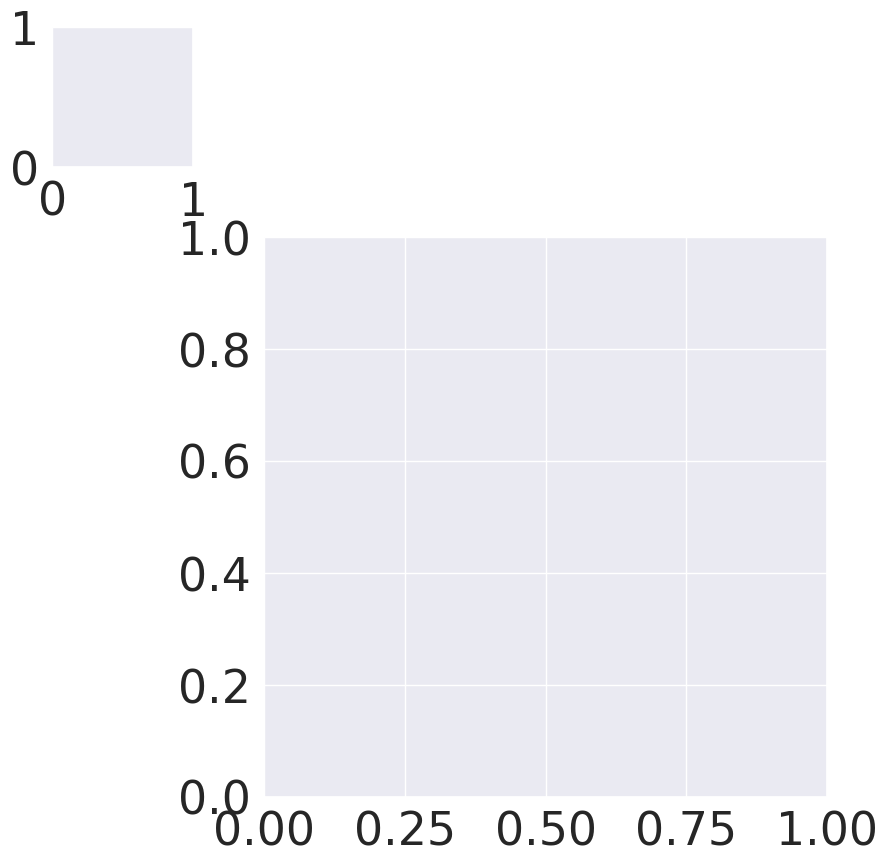

In [9]:
g = sns.clustermap(n_enr)
ax = g.ax_heatmap
ax.set_xlabel("clones")
ax.set_ylabel("clones")